## Notebook for replicating the plots
In this notebook you will learn how to replicate the plots. If you want to know how to generate the data used in the plots, we refer to the gen_temperature_data and gen_precipitation_data notebooks. First we import some packages.

In [4]:
import sys
sys.path.append('../code_persistence_paper/')  # Adjust to the correct parent folder


import matplotlib.pyplot as plt
import numpy as np
from QAR_persistence_precip import QAR_precipitation
from QAR import QAR_temperature
import seaborn as sns
import pandas as pd
from plots_europe import *
from scipy import stats
import os

# Suppress SettingWithCopyWarning
pd.options.mode.chained_assignment = None  

#### Plot figure 1


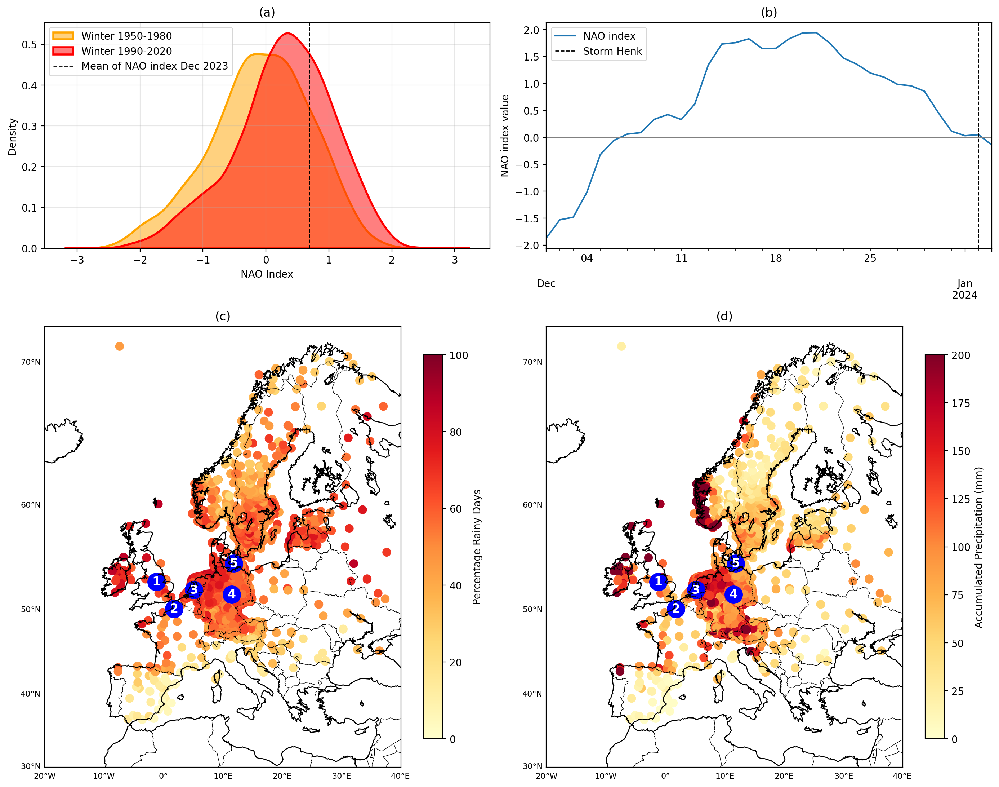

In [5]:
analyze_nao_precipitation()


#### Plot Figure 2

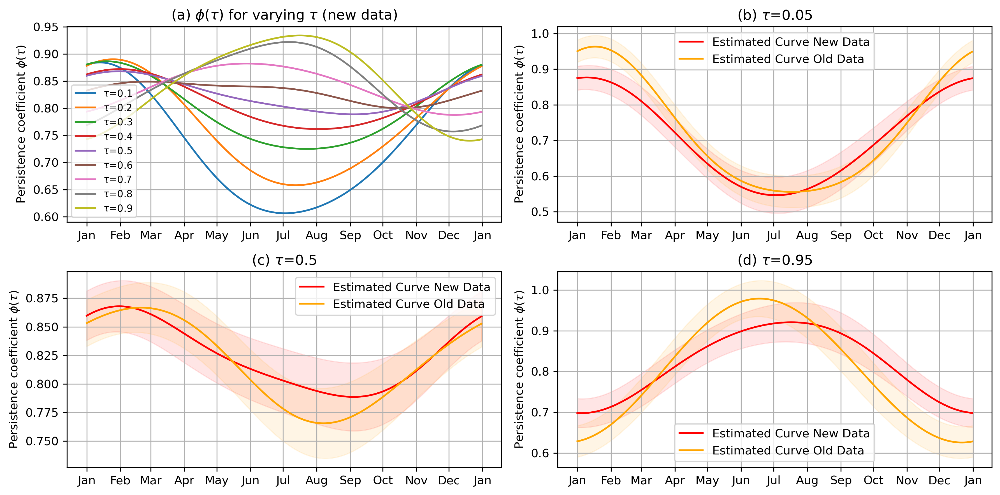

In [7]:
test = QAR_temperature(sCity='DE BILT',use_statsmodels=True, include_nao=False, split_nao=False, iLeafs=1)
test.plot_fourier_fit_full(vTau=[0.05, 0.5, .95], alpha=0.05)

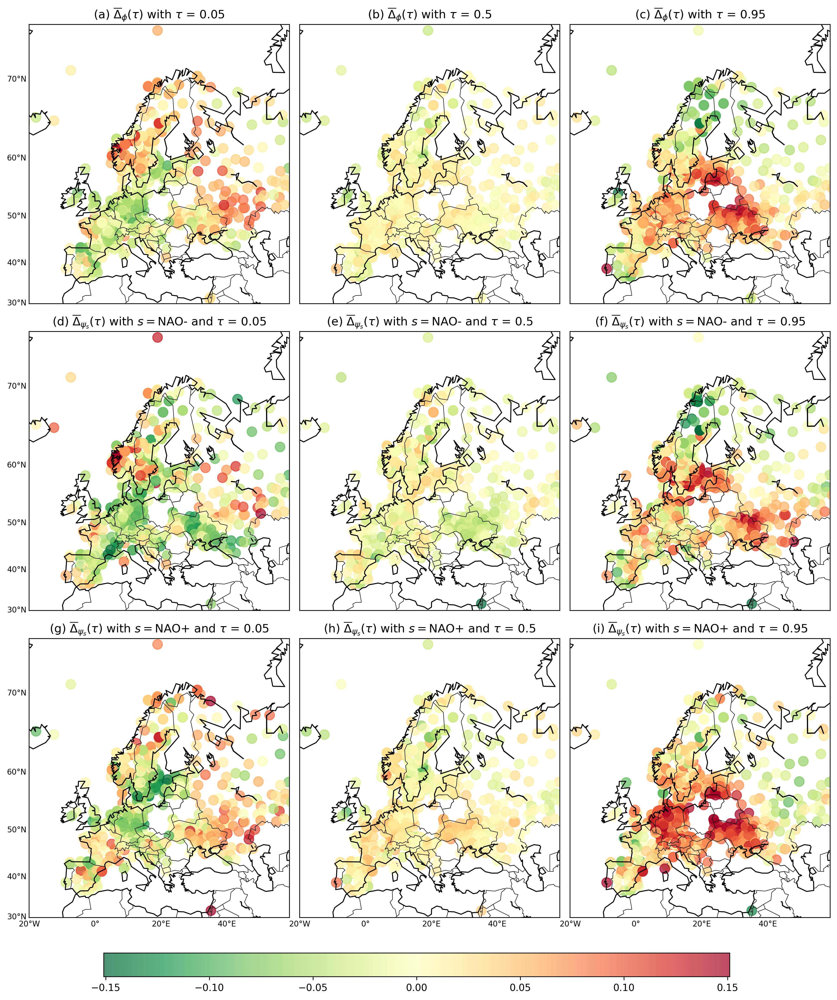

In [3]:
df_05 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_05_1950final.csv')
df_50 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_.5_1950final.csv')
df_95 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_95_1950final.csv')

df_05_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_05_1950includeNAO.csv')
df_50_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_.5_1950includeNAO.csv')
df_95_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_95_1950includeNAO.csv')

df_results_list = [df_05, df_50, df_95, df_05_plusmin, df_50_plusmin, df_95_plusmin]
plot_combined(df_results_list, 'winter')

#### Plot Figure 4


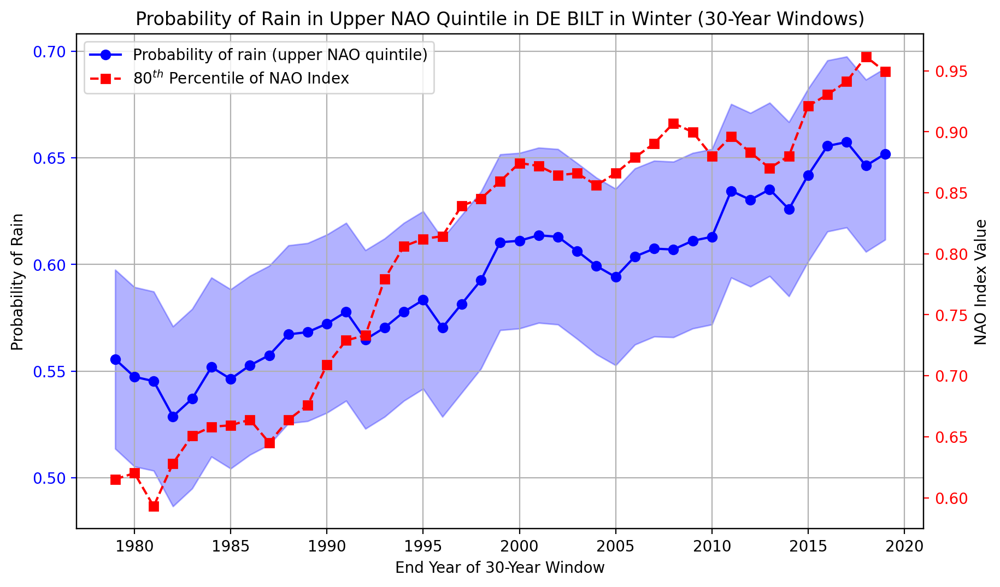

In [2]:
rolling_window_precipitation(sCity='DE BILT')


#### Plot Figure 5

posx and posy should be finite values


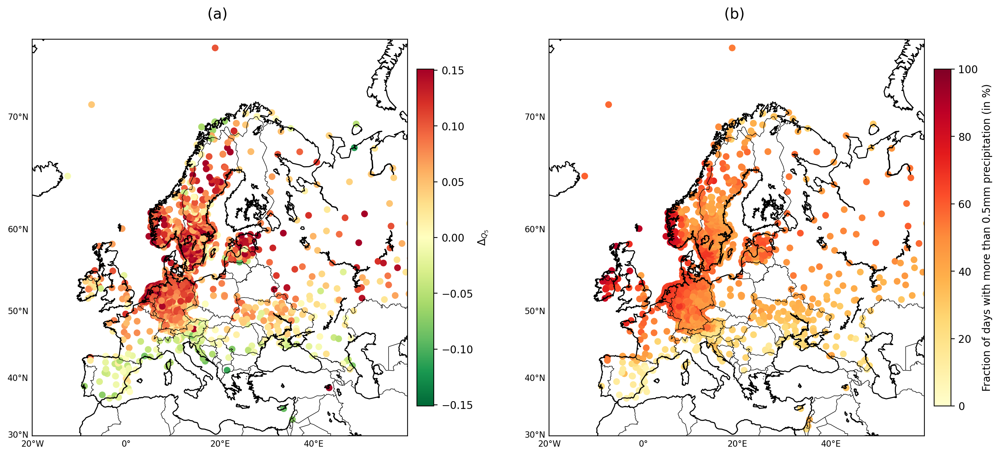

In [3]:
df1 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_precipitation_1950Fig4b.csv')
df2 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_precipitation_1950WithUncProbabilities.csv')

plot_combined_heatmaps(
    df1=df1,  # Now becomes subplot (b)
    df2=df2,          # Now becomes subplot (a)
    sType1='percentage_rainy_days_upperquintile',
    title1='',
    sSeason='winter',
    sType2='_unc',
    title2=''
)

#### Plot Figure 6

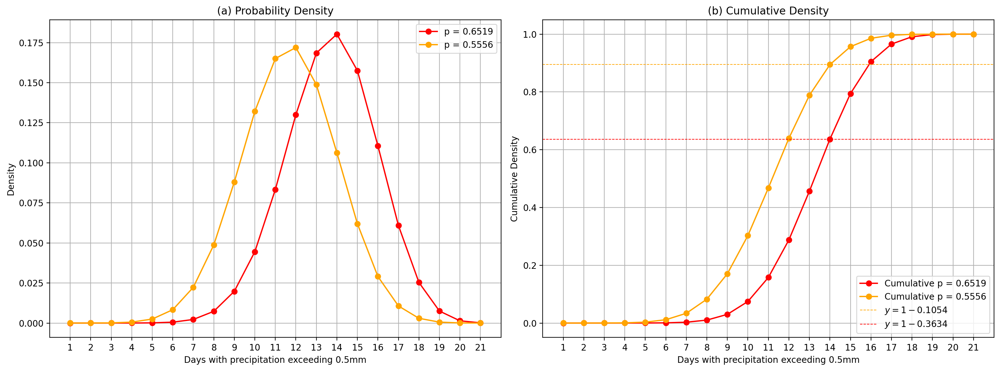

In [13]:
# Parameters
total_days = 21  # Total number of days (trials)
x_days = np.arange(1, total_days + 1)  # Number of consecutive hits (successes)
p1 = 0.6518518518518519  # Probability of precipitation>.5mm for the ''new'' data
p2 = .5555555555555556   # Probability of precipitation>.5mm for the ''old'' data
# Cumulative probabilities (CDF) for both p1 and p2
plot_binomial_probabilities(total_days=total_days, p1=p1, p2=p2)


## APPENDIX
#### Plot Figure 7 

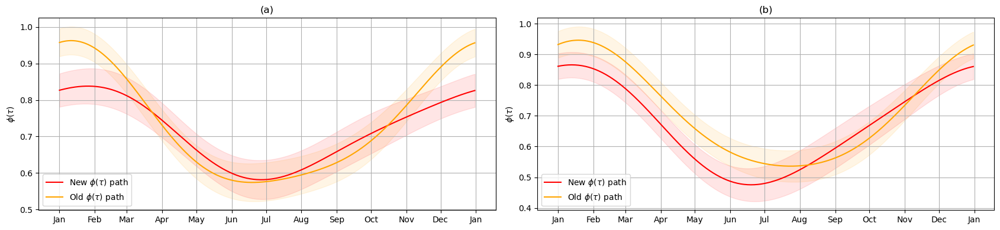

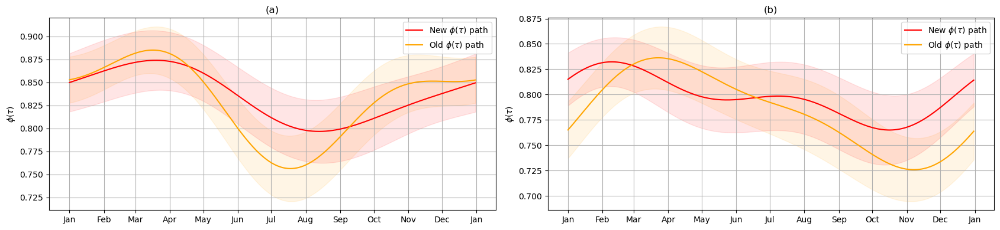

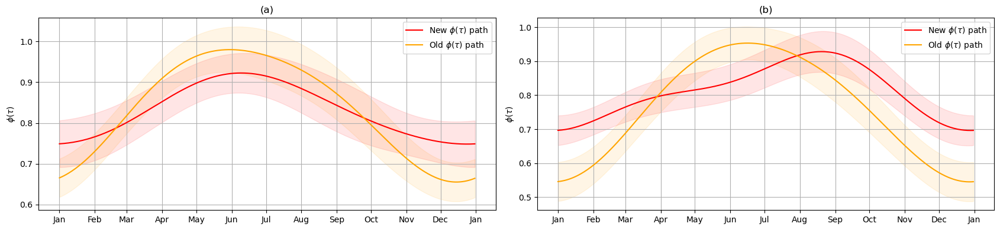

In [4]:
test = QAR_temperature(sCity='DE BILT', fTau=.05, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019)
test = QAR_temperature(sCity='DE BILT', fTau=.5, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019)
test = QAR_temperature(sCity='DE BILT', fTau=.95, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019)


#### Figure 8

Currently calculating coefficients for 1990-2020

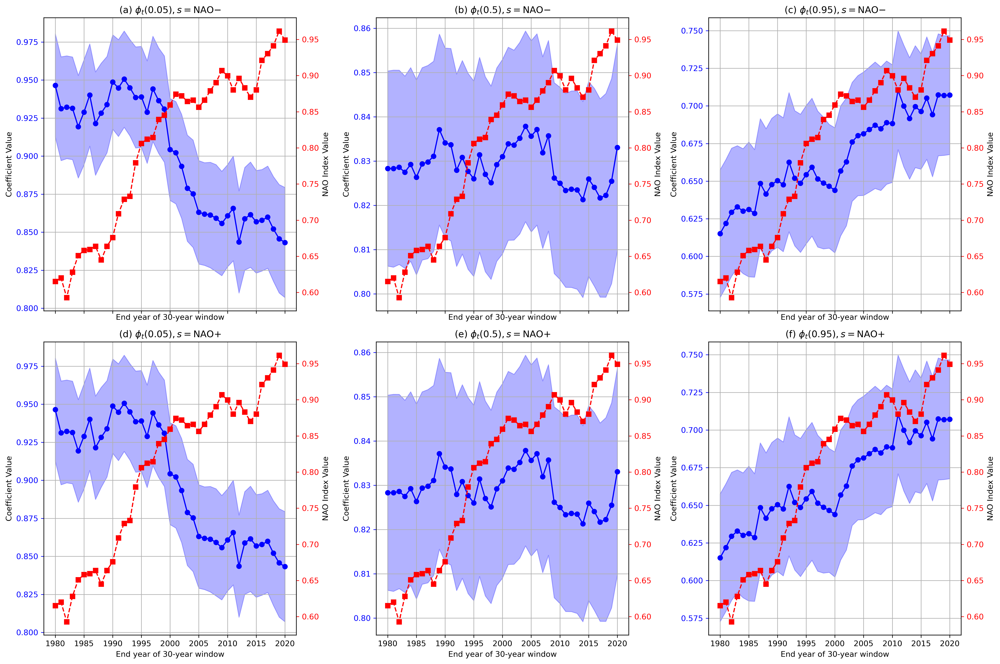

In [3]:
plot_coefficient_evolution(sCity='DE BILT')


#### Figure 9

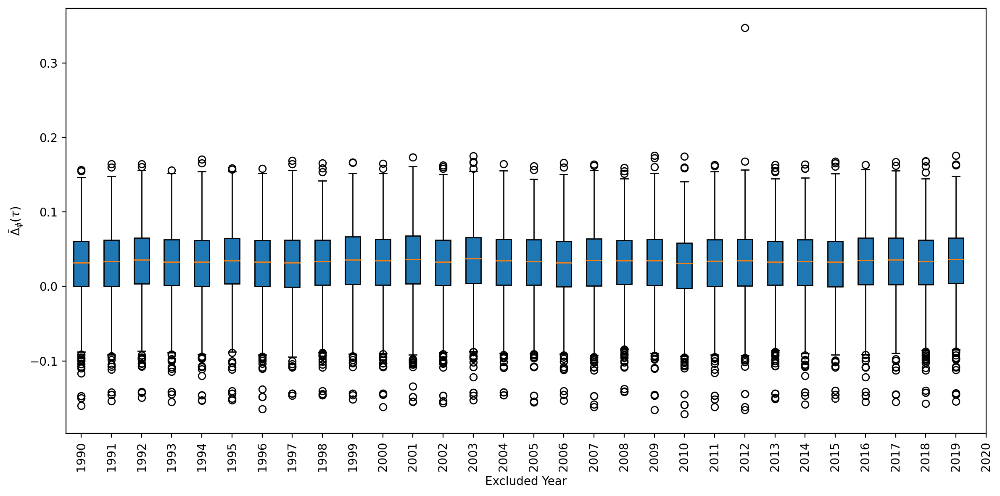

In [8]:
#######FIGURE 9  boxplot temperature

# Directory where the CSV files are located
directory = "../data_persistence/"

# Initialize lists to store data
data = []
excluded_years = []

# Loop through all the files in the directory
for filename in sorted(os.listdir(directory)):
    # Only process files that start with 'results_' and end with '_0.95_1950.csv'
    if filename.startswith("results_") and filename.endswith("_0.95_1950.csv"):
        # Extract the excluded year from the filename
        excluded_year = filename.split('_')[1]
        excluded_years.append(excluded_year)

        # Read the CSV file
        filepath = os.path.join(directory, filename)
        df = pd.read_csv(filepath)

        # Extract the 'mean_diff_pers_winter' column
        if 'mean_diff_pers_winter' in df.columns:
            mean_diff_values = df['mean_diff_pers_winter'].values

            # Remove the maximum value from the column
            mean_diff_values = mean_diff_values[mean_diff_values != mean_diff_values.max()]

            # Append the remaining values to the data list
            data.append(mean_diff_values)

# Create the boxplot
plt.figure(figsize=(12, 6), dpi=200, facecolor="white")
plt.boxplot(data, patch_artist=True)

# Add labels and title
plt.xticks(ticks=range(1, len(excluded_years) + 1), labels=excluded_years, rotation=90)
plt.xlabel("Excluded Year")
plt.ylabel("$\\bar{\\Delta}_{\\phi}(\\tau)$")
#plt.title("Boxplots of $\bar{\Delta}_{\phi}(\tau)$ for 'mean_diff_pers_winter' Across Excluded Years")

# Show the plot
plt.tight_layout()
plt.show()

#### Figure 10

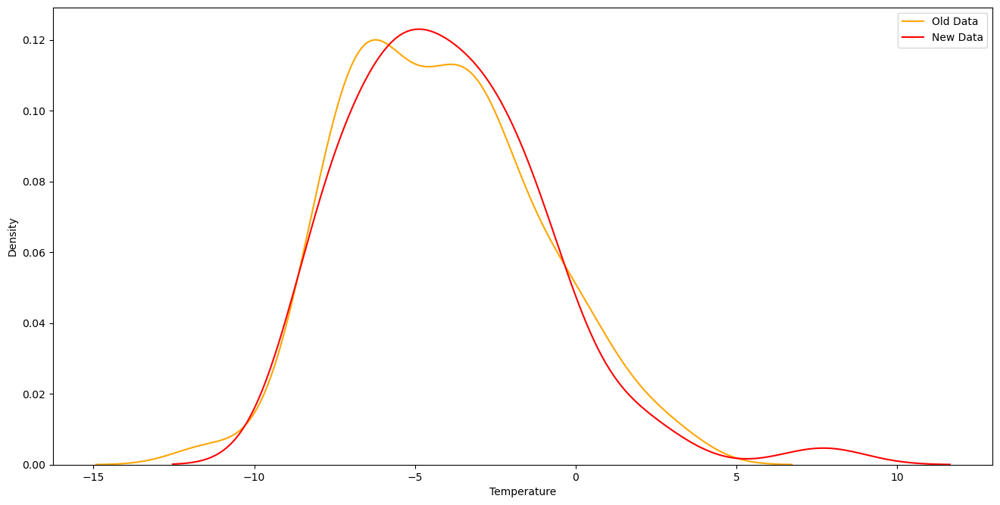

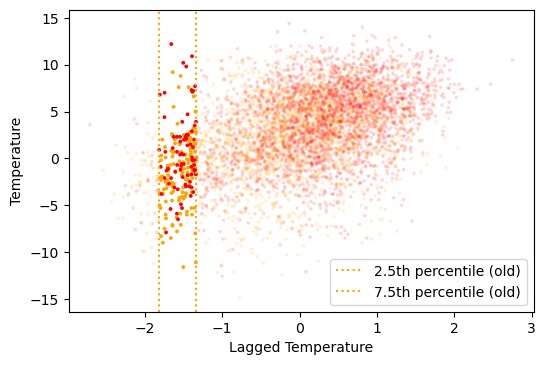

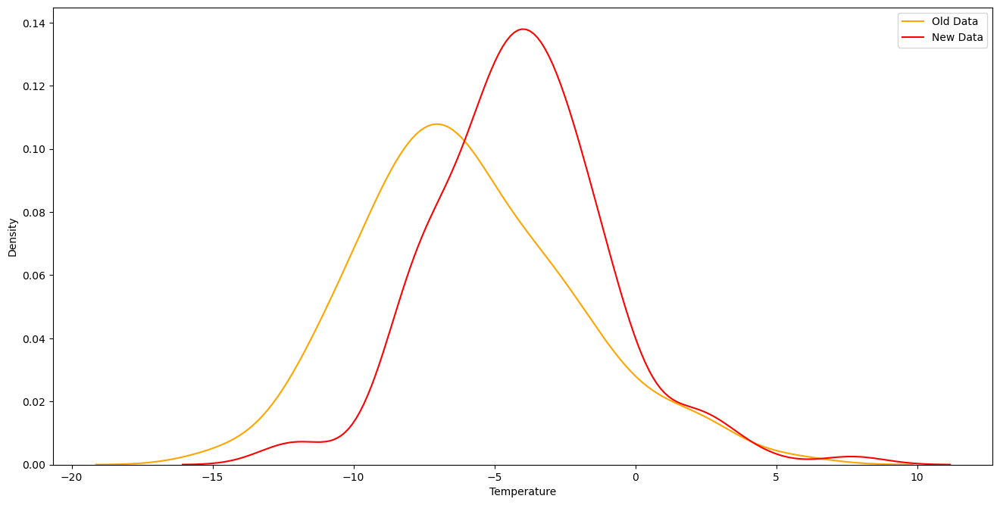

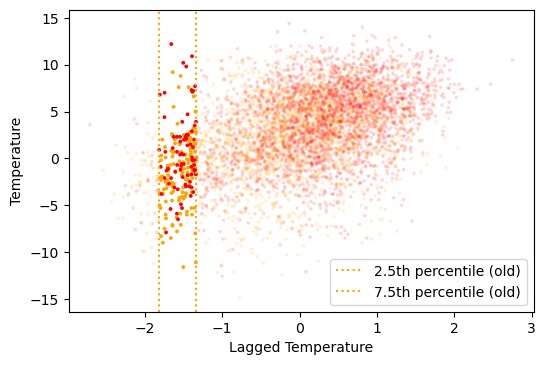

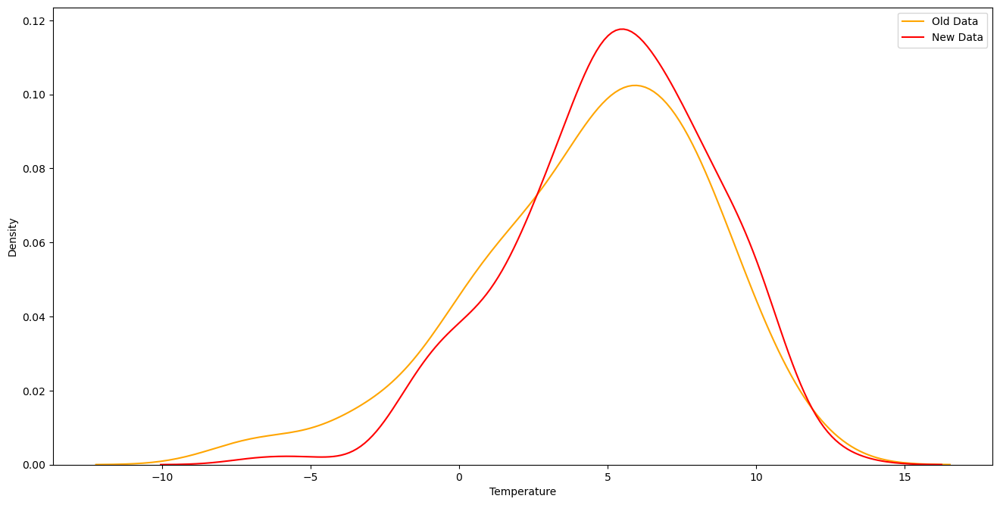

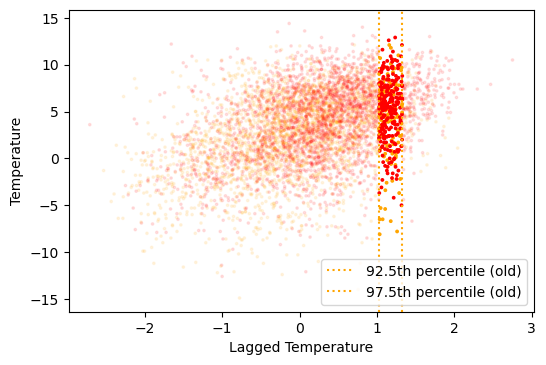

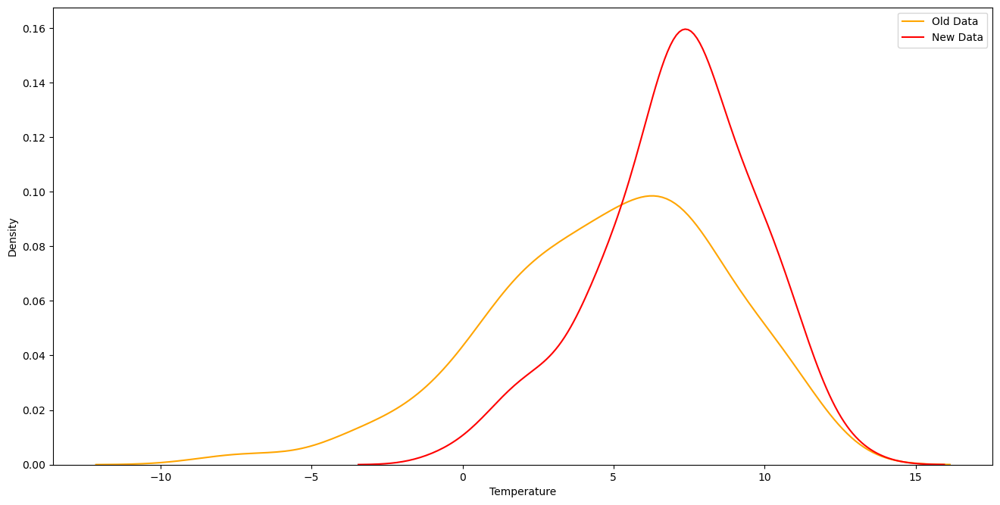

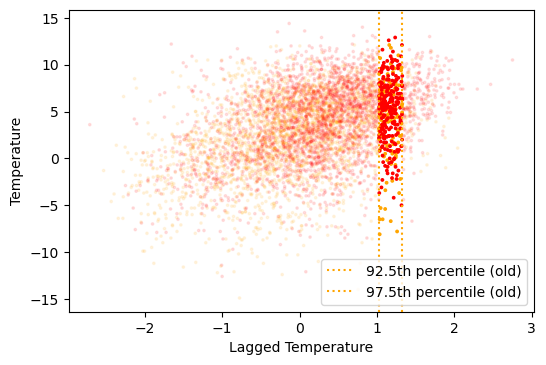

In [2]:
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.05, temp=True, fix_old=True)
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.05, temp=True, fix_old=False)

analyze_temperature_vs_nao(sCity='DE BILT', quant=0.95, temp=False, fix_old=True)
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.95, temp=False, fix_old=False)

#### Figure 11

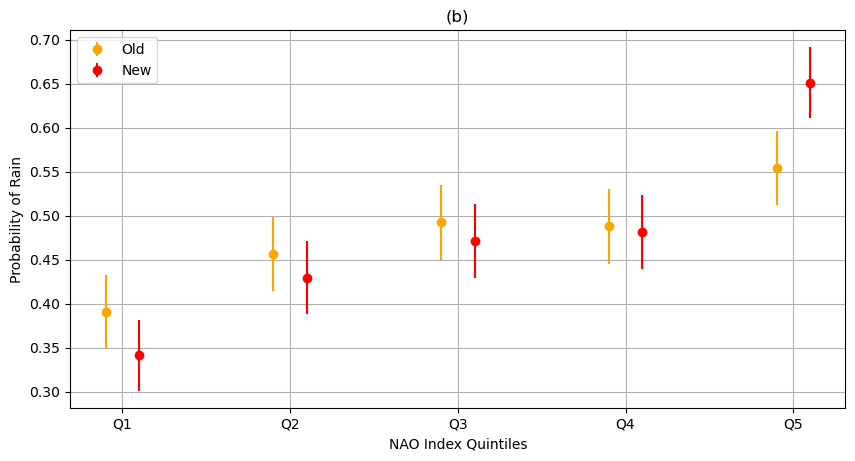

In [2]:
plot_nao_quintiles_vs_rain_prob(sCity='DE BILT')


#### Figure 12

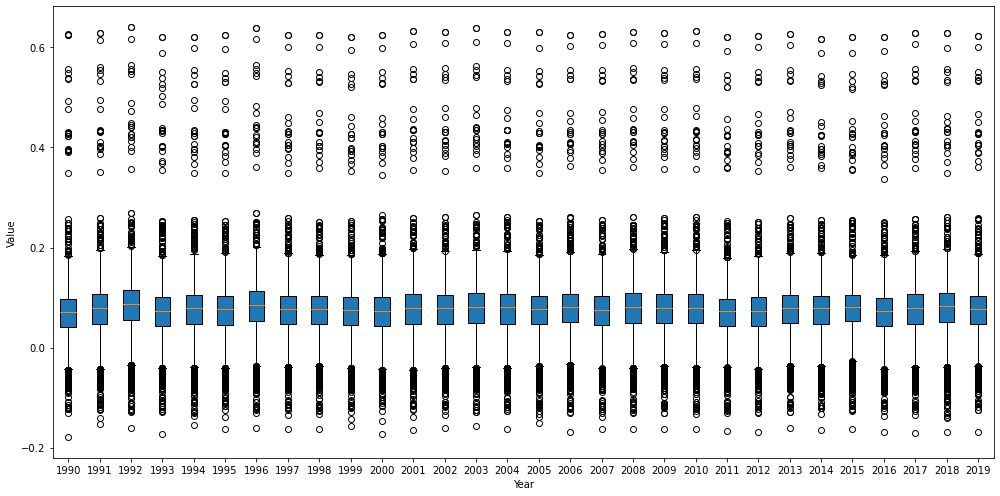

In [9]:
# Path where the new precipitation CSV files are stored
folder_path = '../data_persistence/'  # Replace with your actual folder path

# List all the files that match the "results_precipitation_DJF_YYYY.csv" pattern
files = sorted([file for file in os.listdir(folder_path) if file.startswith('results_precipitation_DJF_') and file.endswith('.csv')])

# Initialize a dictionary to hold data for each year
mean_diff_winter_data = {}

# Loop through the files to extract the relevant data
for file in files:
    # Extract the year from the filename
    year = int(file.split('_')[3].split('.')[0])

    # Process files only in the range of 1990 to 2019
    if 1990 <= year <= 2019:
        # Read the CSV file
        df = pd.read_csv(os.path.join(folder_path, file))

        # Extract the data for the 'mean_diff_winter' variable if it exists
        if 'mean_diff_winter' in df.columns:
            mean_diff_winter_data[year] = df['mean_diff_winter_unc'].dropna()

# Create a boxplot for 'mean_diff_winter' over the years
fig, ax = plt.subplots(figsize=(14, 7))

# Convert the dictionary to a list for plotting
years = sorted(mean_diff_winter_data.keys())
mean_diff_winter = [mean_diff_winter_data[year] for year in years]

# Boxplot for 'mean_diff_winter'
ax.boxplot(mean_diff_winter, labels=years, patch_artist=True)
#ax.set_title('Precipitation - mean_diff_winter')
ax.set_xlabel('Year')
ax.set_ylabel('Value')

plt.tight_layout()
plt.show()
